In [229]:
import pandas as pd

In [230]:
# Load JSON dataset into a DataFrame
dataset_path = r"C:\Users\Raghu\OneDrive\Desktop\Capstone_Projects\E_Commerce_Project\E-Commerce Analysis\fashion_products_dataset.json"
df = pd.read_json(dataset_path, orient='records')

In [231]:
df.head()

,_id,actual_price,average_rating,brand,category,crawled_at,description,discount,images,out_of_stock,pid,product_details,seller,selling_price,sub_category,title,url
0,fa8e22d6-c0b6-5229-bb9e-ad52eda39a0a,"2,999",3.9,York,Clothing and Accessories,2021-02-10 20:11:51,Yorker trackpants made from 100% rich combed c...,69% off,[https://rukminim1.flixcart.com/image/128/128/...,False,TKPFCZ9EA7H5FYZH,"[{'Style Code': '1005COMBO2'}, {'Closure': 'El...",Shyam Enterprises,921,Bottomwear,Solid Men Multicolor Track Pants,https://www.flipkart.com/yorker-solid-men-mult...
1,893e6980-f2a0-531f-b056-34dd63fe912c,"1,499",3.9,York,Clothing and Accessories,2021-02-10 20:11:52,Yorker trackpants made from 100% rich combed c...,66% off,[https://rukminim1.flixcart.com/image/128/128/...,False,TKPFCZ9EJZV2UVRZ,"[{'Style Code': '1005BLUE'}, {'Closure': 'Draw...",Shyam Enterprises,499,Bottomwear,Solid Men Blue Track Pants,https://www.flipkart.com/yorker-solid-men-blue...
2,eb4c8eab-8206-59d0-bcd1-a724d96bf74f,"2,999",3.9,York,Clothing and Accessories,2021-02-10 20:11:52,Yorker trackpants made from 100% rich combed c...,68% off,[https://rukminim1.flixcart.com/image/128/128/...,False,TKPFCZ9EHFCY5Z4Y,"[{'Style Code': '1005COMBO4'}, {'Closure': 'El...",Shyam Enterprises,931,Bottomwear,Solid Men Multicolor Track Pants,https://www.flipkart.com/yorker-solid-men-mult...
3,3f3f97bb-5faf-57df-a9ff-1af24e2b1045,"2,999",3.9,York,Clothing and Accessories,2021-02-10 20:11:53,Yorker trackpants made from 100% rich combed c...,69% off,[https://rukminim1.flixcart.com/image/128/128/...,False,TKPFCZ9ESZZ7YWEF,"[{'Style Code': '1005COMBO3'}, {'Closure': 'El...",Shyam Enterprises,911,Bottomwear,Solid Men Multicolor Track Pants,https://www.flipkart.com/yorker-solid-men-mult...
4,750caa3d-6264-53ca-8ce1-94118a1d8951,"2,999",3.9,York,Clothing and Accessories,2021-02-10 20:11:53,Yorker trackpants made from 100% rich combed c...,68% off,[https://rukminim1.flixcart.com/image/128/128/...,False,TKPFCZ9EVXKBSUD7,"[{'Style Code': '1005COMBO1'}, {'Closure': 'Dr...",Shyam Enterprises,943,Bottomwear,"Solid Men Brown, Grey Track Pants",https://www.flipkart.com/yorker-solid-men-brow...


In [232]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   _id              30000 non-null  object        
 1   actual_price     30000 non-null  object        
 2   average_rating   30000 non-null  object        
 3   brand            30000 non-null  object        
 4   category         30000 non-null  object        
 5   crawled_at       30000 non-null  datetime64[ns]
 6   description      30000 non-null  object        
 7   discount         30000 non-null  object        
 8   images           30000 non-null  object        
 9   out_of_stock     30000 non-null  bool          
 10  pid              30000 non-null  object        
 11  product_details  30000 non-null  object        
 12  seller           30000 non-null  object        
 13  selling_price    30000 non-null  object        
 14  sub_category     30000 non-null  objec

## Data Cleaning

In [233]:
# Remove non-numeric characters from 'actual_price' column
df['actual_price'] = df['actual_price'].replace('[^\d.]', '', regex=True)

# data typecasting
df['actual_price'] = pd.to_numeric(df['actual_price'], errors='coerce', downcast='integer')
df['average_rating'] = pd.to_numeric(df['average_rating'], errors='coerce')
df['selling_price'] = pd.to_numeric(df['selling_price'], errors='coerce')

In [234]:
# Create new columns for crawled_date and crawled_time from column 'crawled_at'
df['crawled_date'] = df['crawled_at'].dt.date
df['crawled_time'] = df['crawled_at'].dt.time

In [235]:
#drop column 'crawled_at'from the dateframe
df = df.drop('crawled_at', axis=1)

In [236]:
df.head()

,_id,actual_price,average_rating,brand,category,description,discount,images,out_of_stock,pid,product_details,seller,selling_price,sub_category,title,url,crawled_date,crawled_time
0,fa8e22d6-c0b6-5229-bb9e-ad52eda39a0a,2999.0,3.9,York,Clothing and Accessories,Yorker trackpants made from 100% rich combed c...,69% off,[https://rukminim1.flixcart.com/image/128/128/...,False,TKPFCZ9EA7H5FYZH,"[{'Style Code': '1005COMBO2'}, {'Closure': 'El...",Shyam Enterprises,921.0,Bottomwear,Solid Men Multicolor Track Pants,https://www.flipkart.com/yorker-solid-men-mult...,2021-02-10,20:11:51
1,893e6980-f2a0-531f-b056-34dd63fe912c,1499.0,3.9,York,Clothing and Accessories,Yorker trackpants made from 100% rich combed c...,66% off,[https://rukminim1.flixcart.com/image/128/128/...,False,TKPFCZ9EJZV2UVRZ,"[{'Style Code': '1005BLUE'}, {'Closure': 'Draw...",Shyam Enterprises,499.0,Bottomwear,Solid Men Blue Track Pants,https://www.flipkart.com/yorker-solid-men-blue...,2021-02-10,20:11:52
2,eb4c8eab-8206-59d0-bcd1-a724d96bf74f,2999.0,3.9,York,Clothing and Accessories,Yorker trackpants made from 100% rich combed c...,68% off,[https://rukminim1.flixcart.com/image/128/128/...,False,TKPFCZ9EHFCY5Z4Y,"[{'Style Code': '1005COMBO4'}, {'Closure': 'El...",Shyam Enterprises,931.0,Bottomwear,Solid Men Multicolor Track Pants,https://www.flipkart.com/yorker-solid-men-mult...,2021-02-10,20:11:52
3,3f3f97bb-5faf-57df-a9ff-1af24e2b1045,2999.0,3.9,York,Clothing and Accessories,Yorker trackpants made from 100% rich combed c...,69% off,[https://rukminim1.flixcart.com/image/128/128/...,False,TKPFCZ9ESZZ7YWEF,"[{'Style Code': '1005COMBO3'}, {'Closure': 'El...",Shyam Enterprises,911.0,Bottomwear,Solid Men Multicolor Track Pants,https://www.flipkart.com/yorker-solid-men-mult...,2021-02-10,20:11:53
4,750caa3d-6264-53ca-8ce1-94118a1d8951,2999.0,3.9,York,Clothing and Accessories,Yorker trackpants made from 100% rich combed c...,68% off,[https://rukminim1.flixcart.com/image/128/128/...,False,TKPFCZ9EVXKBSUD7,"[{'Style Code': '1005COMBO1'}, {'Closure': 'Dr...",Shyam Enterprises,943.0,Bottomwear,"Solid Men Brown, Grey Track Pants",https://www.flipkart.com/yorker-solid-men-brow...,2021-02-10,20:11:53


In [237]:
df.describe()

,actual_price,average_rating,selling_price
count,29137.000000,27554.000000,25478.00000
mean,1472.617703,3.641972,536.31172
std,963.263221,0.664232,211.43639
min,150.000000,1.000000,99.00000
25%,865.000000,3.300000,359.00000
50%,1249.000000,3.800000,499.00000
75%,1799.000000,4.100000,699.00000
max,12999.000000,5.000000,999.00000


In [238]:
df.isnull().sum()

_id                   0
actual_price        863
average_rating     2446
brand                 0
category              0
description           0
discount              0
images                0
out_of_stock          0
pid                   0
product_details       0
seller                0
selling_price      4522
sub_category          0
title                 0
url                   0
crawled_date          0
crawled_time          0
dtype: int64

In [239]:
#handle missing values
df['actual_price'].unique()

array([ 2999.,  1499.,  4499.,  1800.,  2700.,  1799.,  4599.,   399.,
        2469.,  1299.,  2599.,  3299.,  2499.,  1539.,  3019.,  1599.,
        2199.,   999.,  1000.,   569.,   449.,  1625.,   899.,   799.,
         599.,  1999.,  3599.,  2699.,  2299.,  3999.,   499.,   649.,
         749.,  1049.,   699.,  1149.,  1099.,   849.,  1199.,   596.,
         717.,  1899.,  1699.,   998.,  2596.,  1298.,   666.,  4999.,
        6695.,  1200.,   625.,  1500.,  2490.,   990.,  1649.,  1550.,
        1600.,  1651.,  2099.,  2899.,  6999.,  3499.,  3699.,  1399.,
        2799.,   529.,   479.,  3799.,   549.,  5999.,  2399.,   482.,
         397.,    nan,   579.,   572.,   494.,  3100.,  5100.,   924.,
         396.,   669.,   411.,  4299.,  1498.,   492.,  9999.,   513.,
        3399.,  2100.,   484.,  5599.,  5499.,   471.,   979.,  1695.,
        1995.,   995.,   595.,  1395.,  1365.,   695.,  1595.,  2995.,
         945.,  1095.,  2395.,  1495.,  1745.,  2195.,   545.,  1525.,
      

In [240]:
#replace null values with mean average_rating value
mean_rating = df['average_rating'].mean()
df.loc[df['average_rating'].isnull(), 'average_rating'] = mean_rating
df['average_rating'] = df['average_rating'].round(1)
df['average_rating']

0        3.9
1        3.9
2        3.9
3        3.9
4        3.9
        ... 
29995    3.6
29996    3.8
29997    3.6
29998    3.8
29999    3.6
Name: average_rating, Length: 30000, dtype: float64

In [241]:
# Filter rows where 'actual_price' is null
null_price_rows = df[df['actual_price'].isnull()]

# Display the 'sub-category' values for the null 'actual_price' rows
print(null_price_rows[['sub_category', 'actual_price']])


                 sub_category  actual_price
1779                  Topwear           NaN
1817     Clothing Accessories           NaN
2016               Bottomwear           NaN
2022              Winter Wear           NaN
2063              Winter Wear           NaN
...                       ...           ...
27949              Bottomwear           NaN
27993              Bottomwear           NaN
28100                 Topwear           NaN
28129  Innerwear and Swimwear           NaN
29488              Bottomwear           NaN

[863 rows x 2 columns]


In [242]:
df['sub_category'].unique()

array(['Bottomwear', 'Clothing Accessories', 'Winter Wear', 'Raincoats',
       'Topwear', 'Innerwear and Swimwear',
       'Kurtas, Ethnic Sets and Bottoms', 'Blazers, Waistcoats and Suits',
       'Tracksuits', 'Sleepwear', 'SUNSHOPPING Bags, Wallets & Belts',
       'Sunshopping Bags, Wallets & Belts',
       'Crocks Club Clothing and Accessories', "Men's Footwear",
       'Fabrics', 'Inspire Clothing and Accessories',
       'INSPIRE Clothing and Accessories',
       'Winsome Deal Bags, Wallets & Belts',
       'Roy Clothing and Accessories', 'YOFAMA Bags, Wallets & Belts',
       'Party Supplies', 'Brand Trunk Bags, Wallets & Belts',
       'mentiezi Bags, Wallets & Belts',
       'Uber Urban Clothing and Accessories'], dtype=object)

In [243]:
# Filter rows where 'sub_category' is 'Topwear'
topwear_rows = df[df['sub_category'] == 'Topwear']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_actual_price_topwear = topwear_rows['actual_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Topwear') & (df['actual_price'].isnull()), 'actual_price'] = mean_actual_price_topwear

df['actual_price'].isnull().sum()

456

In [244]:
# Filter rows where 'sub_category' is 'Clothing Accessories'
Clothing_Accessories_rows = df[df['sub_category'] == 'Clothing Accessories']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_actual_price_Clothing_Accessories = Clothing_Accessories_rows['actual_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Clothing Accessories') & (df['actual_price'].isnull()), 'actual_price'] = mean_actual_price_Clothing_Accessories


In [245]:
df['actual_price'].isnull().sum()

408

In [246]:
# Filter rows where 'sub_category' is 'Bottomwear'
Bottomwear_rows = df[df['sub_category'] == 'Bottomwear']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_actual_price_Bottomwear = Bottomwear_rows['actual_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Bottomwear') & (df['actual_price'].isnull()), 'actual_price'] = mean_actual_price_Bottomwear


In [247]:
df['actual_price'].isnull().sum()

303

In [248]:
# Filter rows where 'sub_category' is 'Winter Wear'
winter_wear_rows = df[df['sub_category'] == 'Winter Wear']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_actual_price_winter_wear = winter_wear_rows['actual_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Winter Wear') & (df['actual_price'].isnull()), 'actual_price'] = mean_actual_price_winter_wear

In [249]:
df['actual_price'].isnull().sum()

217

In [250]:
# Filter rows where 'sub_category' is 'Innerwear and Swimwear'
Innerwear_Swimwear_rows = df[df['sub_category'] == 'Innerwear and Swimwear']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_actual_price_Innerwear_Swimwear = Innerwear_Swimwear_rows['actual_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Innerwear and Swimwear') & (df['actual_price'].isnull()), 'actual_price'] = mean_actual_price_Innerwear_Swimwear

In [251]:
df['actual_price'].isnull().sum()

35

In [252]:
# Filter rows where 'actual_price' is null
null_price_rows = df[df['actual_price'].isnull()]

# Display the 'sub-category' values for the null 'actual_price' rows
print(null_price_rows[['sub_category', 'actual_price']])


                          sub_category  actual_price
3878                    Men's Footwear           NaN
3882                    Men's Footwear           NaN
3891                    Men's Footwear           NaN
3895                    Men's Footwear           NaN
3938                    Men's Footwear           NaN
3956                    Men's Footwear           NaN
4000                    Men's Footwear           NaN
4073                    Men's Footwear           NaN
4077                    Men's Footwear           NaN
4096                    Men's Footwear           NaN
8121                        Tracksuits           NaN
8155                        Tracksuits           NaN
8157                        Tracksuits           NaN
8212                        Tracksuits           NaN
8219                        Tracksuits           NaN
8227                        Tracksuits           NaN
8244                        Tracksuits           NaN
8260                        Tracksuits        

In [253]:
# Filter rows where 'sub_category' is 'Bottomwear'
Mens_Footwear_rows = df[df['sub_category'] == "Men's Footwear"]

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_actual_price_Mens_Footwear = Mens_Footwear_rows['actual_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == "Men's Footwear") & (df['actual_price'].isnull()), 'actual_price'] = mean_actual_price_Mens_Footwear

df['actual_price'].isnull().sum()

25

In [254]:
# Filter rows where 'sub_category' is 'Bottomwear'
Tracksuits_rows = df[df['sub_category'] == "Tracksuits"]

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_actual_price_Tracksuits = Tracksuits_rows['actual_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == "Tracksuits") & (df['actual_price'].isnull()), 'actual_price'] = mean_actual_price_Tracksuits

df['actual_price'].isnull().sum()

7

In [255]:
# Filter rows where 'sub_category' is 'Bottomwear'
Kurtas_Ethnic_Sets_Bottoms_rows = df[df['sub_category'] == "Kurtas, Ethnic Sets and Bottoms"]

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_actual_price_Kurtas_Ethnic_Sets_Bottoms = Kurtas_Ethnic_Sets_Bottoms_rows['actual_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == "Kurtas, Ethnic Sets and Bottoms") & (df['actual_price'].isnull()), 'actual_price'] = mean_actual_price_Kurtas_Ethnic_Sets_Bottoms

df['actual_price'].isnull().sum()

1

In [256]:
# Drop rows with null values in the 'actual_price' column
df.dropna(subset=['actual_price'], inplace=True)
df['actual_price'].isnull().sum()

0

In [257]:
# Filter rows where 'selling_price' is null
null_price_rows = df[df['selling_price'].isnull()]

# Display the 'sub-category' values for the null 'actual_price' rows
print(null_price_rows[['sub_category', 'selling_price']])


                        sub_category  selling_price
5                         Bottomwear            NaN
10                        Bottomwear            NaN
13                        Bottomwear            NaN
14                        Bottomwear            NaN
16                        Bottomwear            NaN
...                              ...            ...
29988                    Winter Wear            NaN
29995                    Winter Wear            NaN
29997  Blazers, Waistcoats and Suits            NaN
29998                    Winter Wear            NaN
29999                    Winter Wear            NaN

[4522 rows x 2 columns]


In [258]:
# Filter rows where 'sub_category' is 'Bottomwear'
Bottomwear_rows = df[df['sub_category'] == 'Bottomwear']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_actual_price_Bottomwear = Bottomwear_rows['selling_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Bottomwear') & (df['selling_price'].isnull()), 'selling_price'] = mean_actual_price_Bottomwear

df['selling_price'].isnull().sum()

3042

In [259]:
# Filter rows where 'sub_category' is 'Winter Wear'
winterwear_rows = df[df['sub_category'] == 'Winter Wear']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_actual_price_winterwear = winterwear_rows['selling_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Winter Wear') & (df['selling_price'].isnull()), 'selling_price'] = mean_actual_price_winterwear

df['selling_price'].isnull().sum()

1758

In [260]:
# Filter rows where 'selling_price' is null
null_price_rows = df[df['selling_price'].isnull()]

# Display the 'sub-category' values for the null 'actual_price' rows
print(null_price_rows[['sub_category', 'selling_price']])

                        sub_category  selling_price
255                          Topwear            NaN
261                          Topwear            NaN
262                          Topwear            NaN
263                          Topwear            NaN
264                          Topwear            NaN
...                              ...            ...
29522         Innerwear and Swimwear            NaN
29889                     Tracksuits            NaN
29895                     Tracksuits            NaN
29910                     Tracksuits            NaN
29997  Blazers, Waistcoats and Suits            NaN

[1758 rows x 2 columns]


In [261]:
# Filter rows where 'sub_category' is 'Topwear'
Topwear_rows = df[df['sub_category'] == 'Topwear']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_selling_price_Topwear = Topwear_rows['selling_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Topwear') & (df['selling_price'].isnull()), 'selling_price'] = mean_actual_price_Topwear

df['selling_price'].isnull().sum()

591

In [262]:
# Filter rows where 'sub_category' is 'Tracksuits'
Tracksuits_rows = df[df['sub_category'] == 'Tracksuits']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_selling_price_Tracksuits = Tracksuits_rows['selling_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Tracksuits') & (df['selling_price'].isnull()), 'selling_price'] = mean_actual_price_Tracksuits

df['selling_price'].isnull().sum()

513

In [263]:
# Filter rows where 'sub_category' is 'Kurtas, Ethnic Sets and Bottoms'
Kurtas_Ethnic_Sets_Bottoms_rows = df[df['sub_category'] == 'Kurtas, Ethnic Sets and Bottoms']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_selling_price_Kurtas_Ethnic_Sets_Bottoms = Kurtas_Ethnic_Sets_Bottoms_rows['selling_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Kurtas, Ethnic Sets and Bottoms') & (df['selling_price'].isnull()), 'selling_price'] = mean_actual_price_Kurtas_Ethnic_Sets_Bottoms

df['selling_price'].isnull().sum()

296

In [264]:
# Filter rows where 'sub_category' is 'Innerwear and Swimwear'
Innerwear_Swimwear_rows = df[df['sub_category'] == 'Innerwear and Swimwear']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_selling_price_Innerwear_Swimwear = Innerwear_Swimwear_rows['selling_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Innerwear and Swimwear') & (df['selling_price'].isnull()), 'selling_price'] = mean_actual_price_Innerwear_Swimwear

df['selling_price'].isnull().sum()

199

In [265]:
# Filter rows where 'sub_category' is 'Blazers, Waistcoats and Suits'
Blazers_Waistcoats_Suits_rows = df[df['sub_category'] == 'Blazers, Waistcoats and Suits']

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_selling_price_Blazers_Waistcoats_Suits = Blazers_Waistcoats_Suits_rows['selling_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == 'Blazers, Waistcoats and Suits') & (df['selling_price'].isnull()), 'selling_price'] = mean_selling_price_Blazers_Waistcoats_Suits

df['selling_price'].isnull().sum()

116

In [266]:
# Filter rows where 'sub_category' is 'Men's Footwear' and 'actual_price' is null
null_mens_footwear_count = df[(df['sub_category'] == "Men's Footwear") & (df['selling_price'].isnull())].shape[0]

# Display the count of null values for 'actual_price' in 'Men's Footwear'
print("Count of null values in 'selling_price' for 'Men's Footwear':", null_mens_footwear_count)


Count of null values in 'selling_price' for 'Men's Footwear': 74


In [267]:
# Filter rows where 'sub_category' is 'Men's Footwear'
Mens_Footwear_rows = df[df['sub_category'] == "Men's Footwear"]

# Calculate the mean of the 'actual_price' column for 'Topwear'
mean_selling_price_Mens_Footwear_rows = Mens_Footwear_rows['selling_price'].mean()

# Replace null values with the mean for 'Topwear'
df.loc[(df['sub_category'] == "Men's Footwear") & (df['selling_price'].isnull()), 'selling_price'] = mean_selling_price_Mens_Footwear_rows

df['selling_price'].isnull().sum()

42

In [268]:
# Drop rows with null values in the 'selling_price' column
df.dropna(subset=['selling_price'], inplace=True)
df['selling_price'].isnull().sum()

0

In [269]:
df.isnull().sum()

_id                0
actual_price       0
average_rating     0
brand              0
category           0
description        0
discount           0
images             0
out_of_stock       0
pid                0
product_details    0
seller             0
selling_price      0
sub_category       0
title              0
url                0
crawled_date       0
crawled_time       0
dtype: int64

# Data Visualization

In [270]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

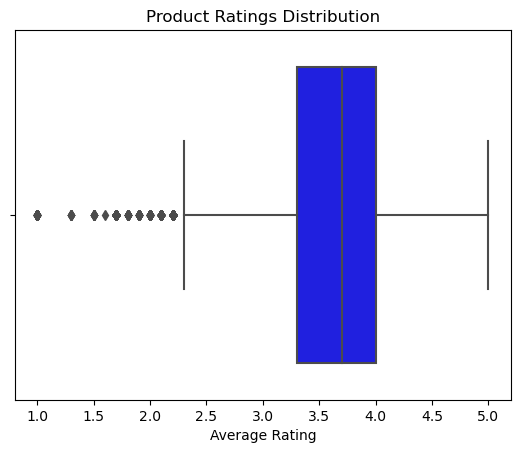

In [228]:
# Convert 'average_rating' to numeric type
df['average_rating'] = pd.to_numeric(df['average_rating'], errors='coerce')

# Visualize product ratings distribution using a box plot
sns.boxplot(x=df['average_rating'], color='blue')
plt.xlabel('Average Rating')
plt.title('Product Ratings Distribution')

plt.show()


In [ ]:
# Explore correlations between attributes
correlation_matrix = df[['actual_price', 'selling_price', 'average_rating']].corr()

# correlation_matrix 
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')

# Add labels and title
plt.title('Correlation Matrix')
plt.show()

In [227]:
# Identify Popular Brands
popular_brands = df['brand'].value_counts().head(10)

print("\nPopular Brands:")
print(popular_brands)


Popular Brands:
brand
                2061
ARBO             999
True Bl          996
REEB             996
Pu               995
ECKO Unl         993
Free Authori     864
Keo              668
Amp              621
Black Beat       560
Name: count, dtype: int64


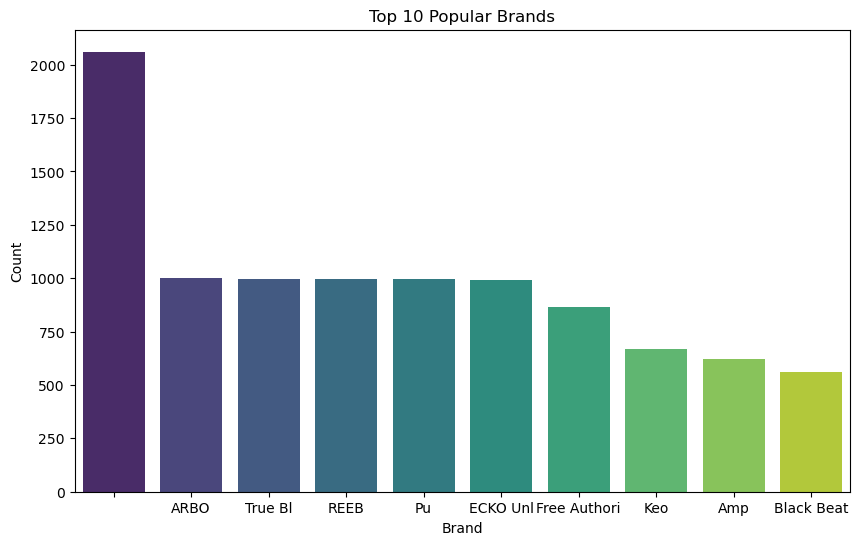

In [226]:
# popular_brands with brand counts
plt.figure(figsize=(10, 6))  

# Create a bar plot for the top 10 popular brands
sns.barplot(x=popular_brands.index, y=popular_brands.values, palette='viridis')

# Add labels and title
plt.xlabel('Brand')
plt.ylabel('Count')
plt.title('Top 10 Popular Brands')

# Display the plot
plt.show()


In [225]:
# Identify Popular Product Categories
popular_categories = df['category'].value_counts().head(5)
print("Popular Product Categories:")
print(popular_categories)

Popular Product Categories:
category
Clothing and Accessories    28928
Footwear                      987
Bags, Wallets & Belts          41
Toys                            1
Name: count, dtype: int64


In [224]:
# Identify Popular Product Categories
popular_categories = df['category'].value_counts().head(5)

# popular_categories with category counts
fig = px.bar(
    popular_categories,
    x=popular_categories.index,
    y=popular_categories.values,
    text=popular_categories.values,  # Display count as text on the bars
    labels={'x': 'Categories', 'y': 'Count'},
    title='Popular Categories',
    template='plotly', 
)

# Adjust layout for better readability
fig.update_layout(
    xaxis=dict(tickangle=45),
    yaxis=dict(title_standoff=20),
)

# Show the interactive plot
fig.show()


In [223]:
# Analyze Top-Selling Products based on Sales Volume
top_selling_products = df.groupby('title')['pid'].count().sort_values(ascending=False).head(5)
print("\nTop-Selling Products:")
print(top_selling_products)


Top-Selling Products:
title
Printed Men Round Neck Black T-Shirt    856
Printed Men Round Neck White T-Shirt    703
Slides                                  556
Full Sleeve Solid Men Sweatshirt        519
Printed Men Round Neck Blue T-Shirt     363
Name: pid, dtype: int64


In [222]:
# top_selling_products with product counts
fig = px.bar(
    top_selling_products,
    x=top_selling_products.index,
    y=top_selling_products.values,
    labels={'x': 'Products', 'y': 'Sales Volume'},
    title='Top 5 Selling Products',
    template='plotly',  
)

# Rotate x-axis labels for better readability 
fig.update_layout(xaxis=dict(tickangle=45))

# Show the interactive plot
fig.show()


In [221]:
# Analyze Top-Rated Products based on Average Rating
top_rated_products = df.groupby('title')['average_rating'].mean().sort_values(ascending=False).head(10)
print("\nTop-Rated Products:")
print(top_rated_products)


Top-Rated Products:
title
Full Sleeve Argyle Men Sweatshirt                                 5.0
Solid Men Polo Neck Orange, Grey T-Shirt  (Pack of 2)             5.0
Color Block Men Round Neck White, Green T-Shirt                   5.0
Tapered Men Black Cotton Blend Trousers                           5.0
Loafers For Men  (Grey)                                           5.0
Solid Men Polo Neck Green, Orange, Yellow T-Shirt  (Pack of 3)    5.0
Solid Men Maroon Regular Shorts                                   5.0
Striped Men Polo Neck White, Pink, Grey T-Shirt                   5.0
Solid Men Collared Neck White T-Shirt  (Pack of 2)                5.0
Printed Men Red Regular Shorts                                    5.0
Name: average_rating, dtype: float64


In [220]:
# top_rated_products with average ratings
fig = px.bar(
    top_rated_products,
    x=top_rated_products.index,
    y=top_rated_products.values,
    labels={'x': 'Products', 'y': 'Average Rating'},
    title='Top 10 Rated Products',
    template='plotly',  # You can choose a different template if needed
)

# Rotate x-axis labels for better readability (optional)
fig.update_layout(xaxis=dict(tickangle=45))

# Show the interactive plot
fig.show()


In [219]:
# Analyze Customer Preferences based on Average Rating
customer_preferences = df.groupby('category')['average_rating'].mean().sort_values(ascending=False).head(5)
print("\nCustomer Preferences by Category:")
print(customer_preferences)


Customer Preferences by Category:
category
Bags, Wallets & Belts       4.126829
Footwear                    3.875684
Clothing and Accessories    3.629774
Toys                        3.600000
Name: average_rating, dtype: float64


In [217]:
# customer_preferences with category and average ratings
fig = px.bar(
    customer_preferences,
    x='average_rating',
    y=customer_preferences.index,
    labels={'average_rating': 'Average Rating', 'y': 'Category'},
    title='Customer Preferences by Category',
    template='plotly',  # You can choose a different template if needed
)

# Show the interactive plot
fig.show()


In [ ]:
df.columns

In [192]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29957 entries, 0 to 29999
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   _id                  29957 non-null  object        
 1   actual_price         29957 non-null  float64       
 2   average_rating       29957 non-null  float64       
 3   brand                29957 non-null  object        
 4   category             29957 non-null  object        
 5   description          29957 non-null  object        
 6   discount             0 non-null      float64       
 7   images               29957 non-null  object        
 8   out_of_stock         29957 non-null  bool          
 9   pid                  29957 non-null  object        
 10  product_details      29957 non-null  object        
 11  seller               29957 non-null  object        
 12  selling_price        29957 non-null  float64       
 13  sub_category         29957 non-null 

In [193]:
df['crawled_date'].unique()

<DatetimeArray>
['2021-02-10 00:00:00', '2021-02-11 00:00:00']
Length: 2, dtype: datetime64[ns]

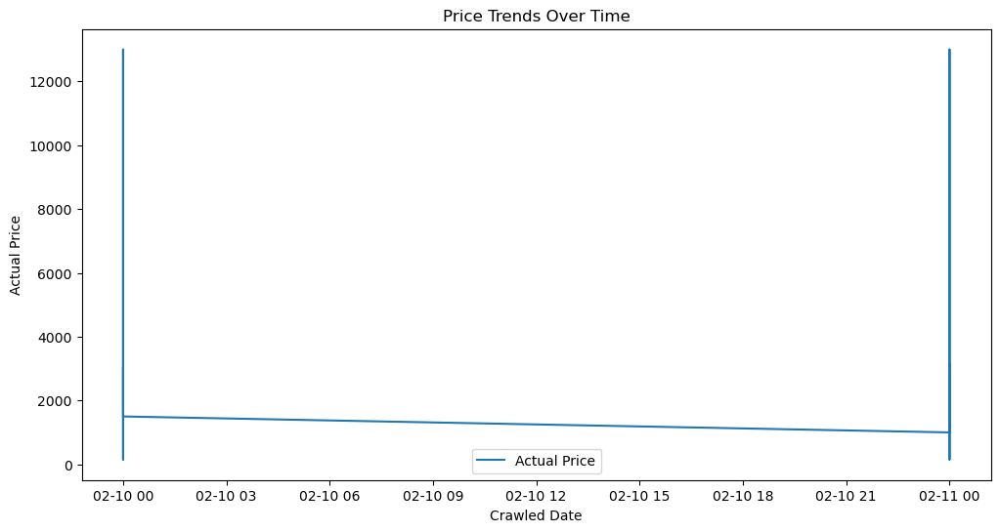

In [215]:
# Convert 'crawled_date' to datetime format
df['crawled_date'] = pd.to_datetime(df['crawled_date'], errors='coerce')

# Plot time series
plt.figure(figsize=(12, 6))
plt.plot(df['crawled_date'], df['actual_price'], label='Actual Price')
plt.xlabel('Crawled Date')
plt.ylabel('Actual Price')
plt.title('Price Trends Over Time')
plt.legend()
plt.show()


In [214]:
# Convert 'crawled_date' to datetime format
df['crawled_date'] = pd.to_datetime(df['crawled_date'], errors='coerce')

# Create an interactive time series plot
fig = px.line(df, x='crawled_date', y=['actual_price', 'selling_price'],
              labels={'value': 'Price', 'variable': 'Price Type'},
              title='Price Trends Over Time',
              hover_data={'crawled_date': '|%B %d, %Y'})
fig.show()


In [213]:
# Analyze Pricing Trends
average_actual_price = df['actual_price'].mean()
average_selling_price = df['selling_price'].mean()

# Create a DataFrame for visualization
average_prices_df = pd.DataFrame({
    'Price Type': ['Actual Price', 'Selling Price'],
    'Average Price': [average_actual_price, average_selling_price]
})

# Create an interactive bar plot
fig = px.bar(average_prices_df, x='Price Type', y='Average Price', text='Average Price',
             title='Average Actual Price vs Selling Price',
             labels={'Average Price': 'Average Price ($)'},
             color='Price Type')
fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.show()


C:\Users\Raghu\anaconda3\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [212]:
# Calculate the number of products offered by each seller
seller_product_counts = df['seller'].value_counts().reset_index()
seller_product_counts.columns = ['Seller', 'Product Count']

# Select the top 25 sellers
top_25_sellers = seller_product_counts.head(25)

# Create an interactive bar plot for the top 25 sellers
fig = px.bar(top_25_sellers, x='Seller', y='Product Count',
             title='Top 25 Sellers by Number of Products Offered',
             labels={'Product Count': 'Number of Products'},
             hover_data={'Seller': True, 'Product Count': True})
fig.update_layout(xaxis_title='Seller', yaxis_title='Number of Products')
fig.show()



In [211]:
discount_stats = df[['discount_percentage', 'price_difference']].describe()
print(discount_stats)


       discount_percentage  price_difference
count         29957.000000      29957.000000
mean             51.706062        802.711799
std              20.585666        791.427935
min               0.000000          0.000000
25%              42.195122        363.000000
50%              56.312625        600.000000
75%              65.065065       1011.000000
max              94.544022      12289.777400


In [210]:
import plotly.express as px

fig = px.histogram(df, x='discount_percentage', nbins=30,
                   title='Distribution of Discount Percentages',
                   labels={'discount_percentage': 'Discount Percentage'})
fig.show()


In [209]:
seller_discount_stats = df.groupby('seller')['discount_percentage'].mean().reset_index()
fig = px.bar(seller_discount_stats, x='seller', y='discount_percentage',
             title='Average Discount Percentage by Seller',
             labels={'discount_percentage': 'Average Discount Percentage'})
fig.show()


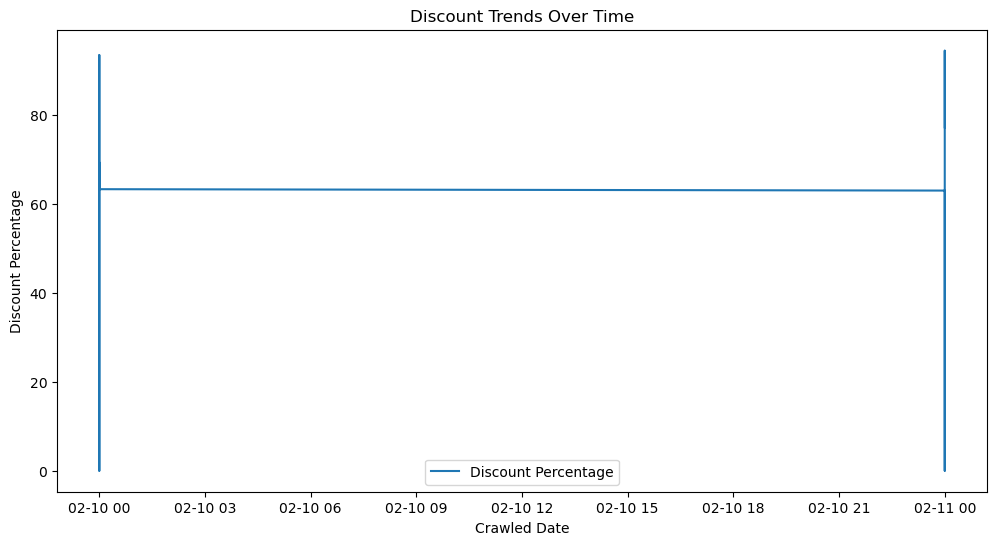

In [208]:
import matplotlib.pyplot as plt

# Convert 'crawled_date' to datetime format
df['crawled_date'] = pd.to_datetime(df['crawled_date'], errors='coerce')

# Plot discount trends over time
plt.figure(figsize=(12, 6))
plt.plot(df['crawled_date'], df['discount_percentage'], label='Discount Percentage')
plt.xlabel('Crawled Date')
plt.ylabel('Discount Percentage')
plt.title('Discount Trends Over Time')
plt.legend()
plt.show()


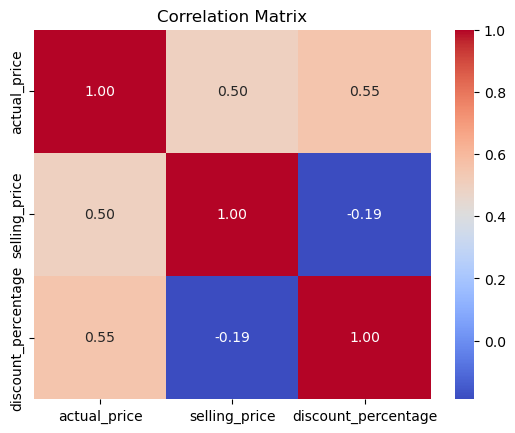

In [207]:
# Explore correlations between attributes
correlation_matrix = df[['actual_price', 'selling_price', 'discount_percentage']].corr()

# correlation_matrix 
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')

# Add labels and title
plt.title('Correlation Matrix')
plt.show()


In [197]:
# Visualization: Scatter Plot for Actual Price vs. Selling Price
fig = px.scatter(df, x='actual_price', y='selling_price',
                 title='Scatter Plot: Actual Price vs. Selling Price',
                 labels={'actual_price': 'Actual Price', 'selling_price': 'Selling Price'},
                 hover_data=['actual_price', 'selling_price'])
fig.show()

C:\Users\Raghu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Raghu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Raghu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Raghu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Raghu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

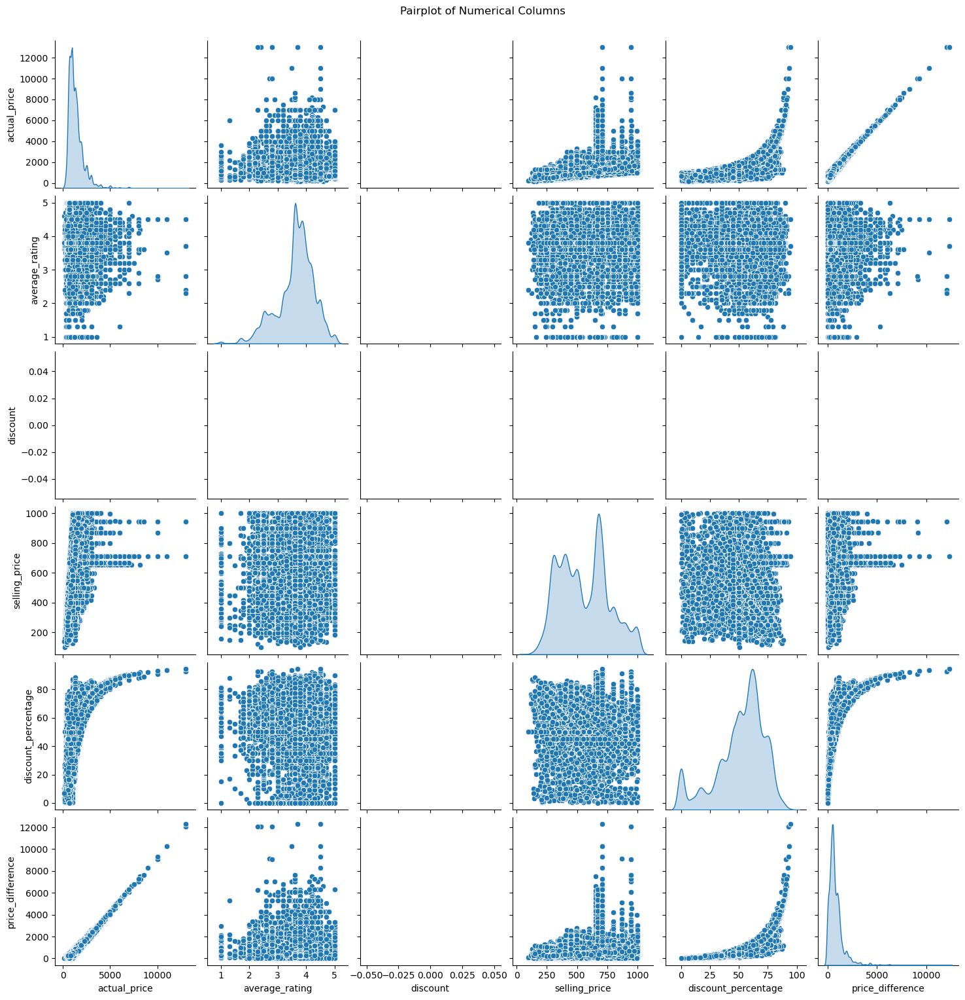

In [204]:
# Pairplot for numerical columns
# Select only numerical columns
numerical_columns = df.select_dtypes(include=['float64', 'int64'])

# Pairplot for numerical columns
sns.pairplot(numerical_columns, diag_kind='kde')
plt.suptitle('Pairplot of Numerical Columns', y=1.02)
plt.show()


In [206]:
# Create an interactive boxplot
fig = px.box(df, x='category', y='selling_price', points="outliers", title='Boxplot of Selling Prices by Category')
fig.update_layout(xaxis=dict(title='Product Category'), yaxis=dict(title='Selling Price'))
fig.update_xaxes(tickangle=45, tickmode='array')
fig.show()


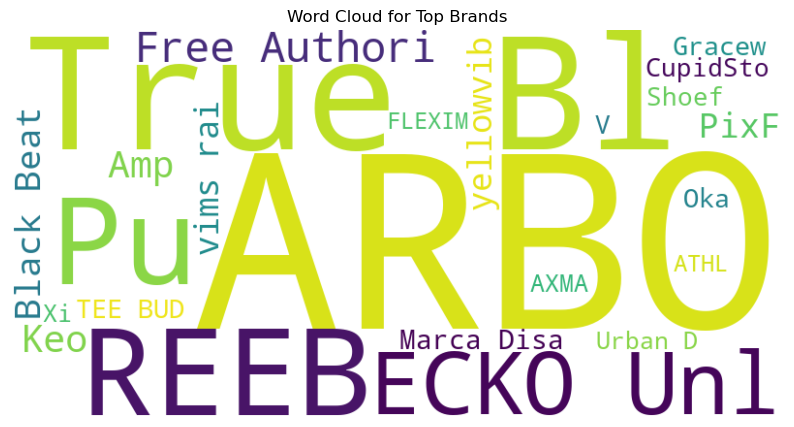

In [203]:
from wordcloud import WordCloud

# Calculate the frequency of each brand
brand_counts = df['brand'].value_counts()

# Select top N brands for the word cloud (adjust N as needed)
top_brands = brand_counts.head(25)

# Create a dictionary for word cloud
wordcloud_dict = {brand: count for brand, count in top_brands.items()}

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_dict)

# Plot the word cloud using matplotlib and seaborn
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Top Brands')
plt.show()
